In [1]:
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing as mp
import h5py

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

%matplotlib inline
%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')

### Time to get your hands dirty! Can a computer learn if we're going to detect gravitational waves?

This episode of "time to get your hands dirty" is about something I studied carefully in the past: gravitational-wave selection effects. This is one the LIGO interferometers:

![](https://www.ligo.caltech.edu/system/news_items/images/53/page/Virgo_aerial_view_01.jpg?1506530275)


All experiments have selection effects. Some sources are easier to detect than others which distorts the population of sources we observe (this crucial in astronomy! Surveys are typically flux limited). 
In order to decided if a feature in the observed population of objects is telling us something new about reality, we need to understand and model our selection effects (for instance: it would be wrong to say that all stars are close by just because we can't observe those that are very far!). In observational astronomy, this is known as [Malmquist bias](https://en.wikipedia.org/wiki/Malmquist_bias) and was first formulated in 1922.
 
**The goal here is to machine-learn the LIGO detectability: can we *predict* if a gravitational-wave source will be detected?**  

[This dataset](https://github.com/dgerosa/pdetclassifier/releases/download/v0.2/sample_2e7_design_precessing_higherordermodes_3detectors.h5) contains simulated gravitational-wave signals from merging black holes (careful the file size is >1 GB). If you've never seen them, the [.h5 format](https://en.wikipedia.org/wiki/Hierarchical_Data_Format) is a highly optimized storage strategy for large datasets. It's amazing. In python, you can read it with `h5py`.

In particular, each source has the following features:
- `mtot`: the total mass of the binary
- `q`: the mass ratio
- `chi1x`, `chi1y`, `chi1z`, `chi2x`, `chi2y`, `chi2z`: the components of the black-hole spins in a suitable reference frame.
- `ra`, `dec`: the location of the source in the sky
- `iota`: the inclination of the orbital plane'
- `psi`: the polarization angle (gravitational waves have two polarization states much like light)
- `z`: the redshift

The detectability is defined using the `snr` (signal-to-noise ratio) computed with a state-of-the-art model of the LIGO/Virgo detector network. Some (many?) of you will have studied this in Sesana's gravitational-wave course; [see here](https://arxiv.org/abs/1908.11170) for a nice write-up. All you need to know now is that we threshold the `snr` values and assume that LIGO will (not) see a source if `snr`>12 (`snr`<12). The resulting 0-1 labels are reported in the `det` attribute in the dataset.

Today's task is to train a classifier (you decide which one!) and separate sources that are detectables from those that aren't. 

Be creative! This is a challenge! Let's see who gets the  higher completeness and/or the smaller contamination (on a validation set, of course! Careful with overfitting here!).

*Tips*:
- You can downsample the data for debugging purposes
- You can also use only some of the features.

### The best I could do...

Together with Alberto Vecchio and Geraint Prattent, I tackled this classification problem with neural networks: [arXiv:2007.06585](https://arxiv.org/abs/2007.06585). Next time we look into deep learning.

In the paper we reached an accuracy (true positive + true negative / total) of $98.4\%$. The data you're using are those of the green curve in Fig 2 of that paper. Could you do better? If yes, please tell me how!

I should have really put a figure with my ROC in that paper but I didn't! Deep learning people liked the accuracy and I just went with the flow.


### Another idea

Here are other ideas that I haven't explored in a paper (yet?). 

- Using the same data, we could run a regressor on `snr` instead of a classifier on `det`. We can then threshold the predictions (instead of tresholding the data like we're doing now). Would this give a better performance?

- How about trying to reduce the dimensionality of the dataset with a PCA-type algorithm to ease the classification problem?

Please let me know if you give it a try and what you find! 




# Code

## 1) Extracting the data

In [2]:
f = h5py.File('sample_2e7_design_precessing_higherordermodes_3detectors.h5')
keys = list(f.keys())
print(f'keys: {keys}')
print(f['snr'].shape)

keys: ['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'det', 'iota', 'mtot', 'psi', 'q', 'ra', 'snr', 'z']
(20000000,)


In [3]:
cutoff = int(1e5)

y = f['det'][:cutoff]
mask = (y==1)

#X_names = ['z', '$\log_{10} M_{tot}$', 'q', '$\psi$', '$\iota$']
X_names = ['z', '$\iota$', '$M_{tot}$', 'q', '$\psi$',]
X = np.array([f['z'][:cutoff], f['iota'][:cutoff], f['mtot'][:cutoff], f['q'][:cutoff], f['psi'][:cutoff]]).T
print(X.shape)

f = []

(100000, 5)


## 2) Exploring the data

In [4]:
def Plot(x_data, y_data, xlabel, ylabel):
    plt.scatter(x_data[mask], y_data[mask], s=4, c='red', linewidths=0, label='Detectable')
    plt.scatter(x_data[~mask], y_data[~mask], s=4, c='royalblue', linewidths=0, label='Not detectable')
    
    xlim = (np.min(x_data), np.max(x_data))
    ylim = (np.min(y_data), np.max(y_data))
    plt.xlim(xlim)
    plt.ylim(ylim)
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    legend = plt.legend(loc='upper right')
    for marker in legend.legend_handles: marker._sizes = marker._sizes*10

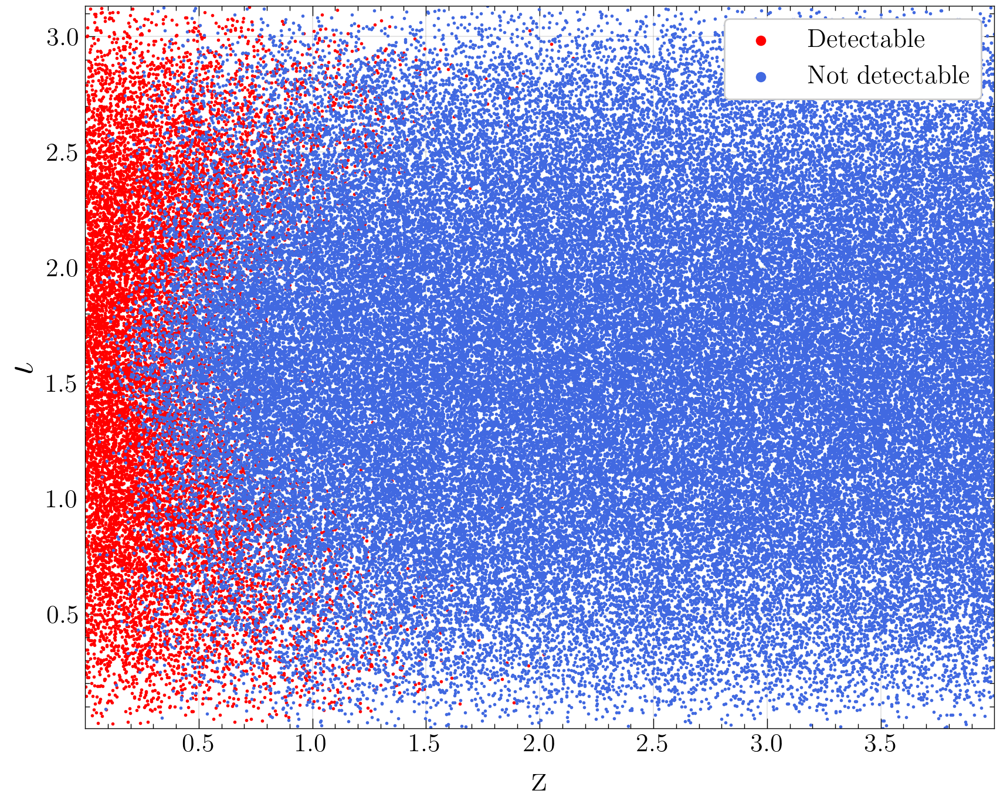

In [5]:
Plot(X[:,0], X[:,1], X_names[0], X_names[1])

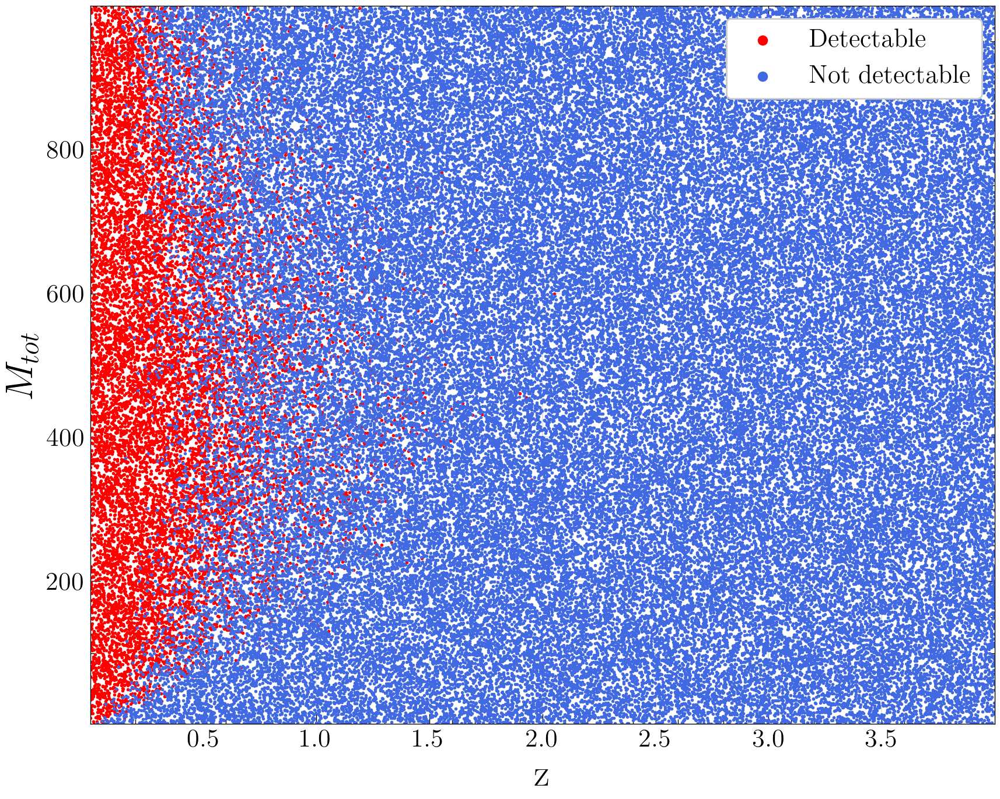

In [6]:
Plot(X[:,0], X[:,2], X_names[0], X_names[2])

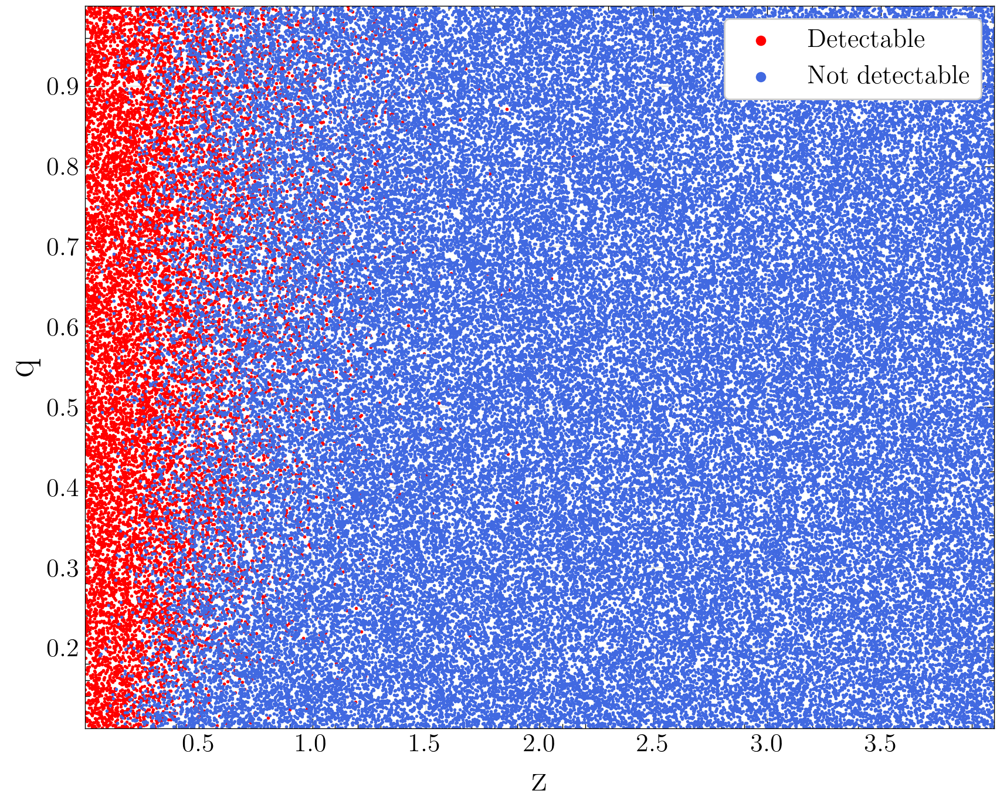

In [7]:
Plot(X[:,0], X[:,3], X_names[0], X_names[3])

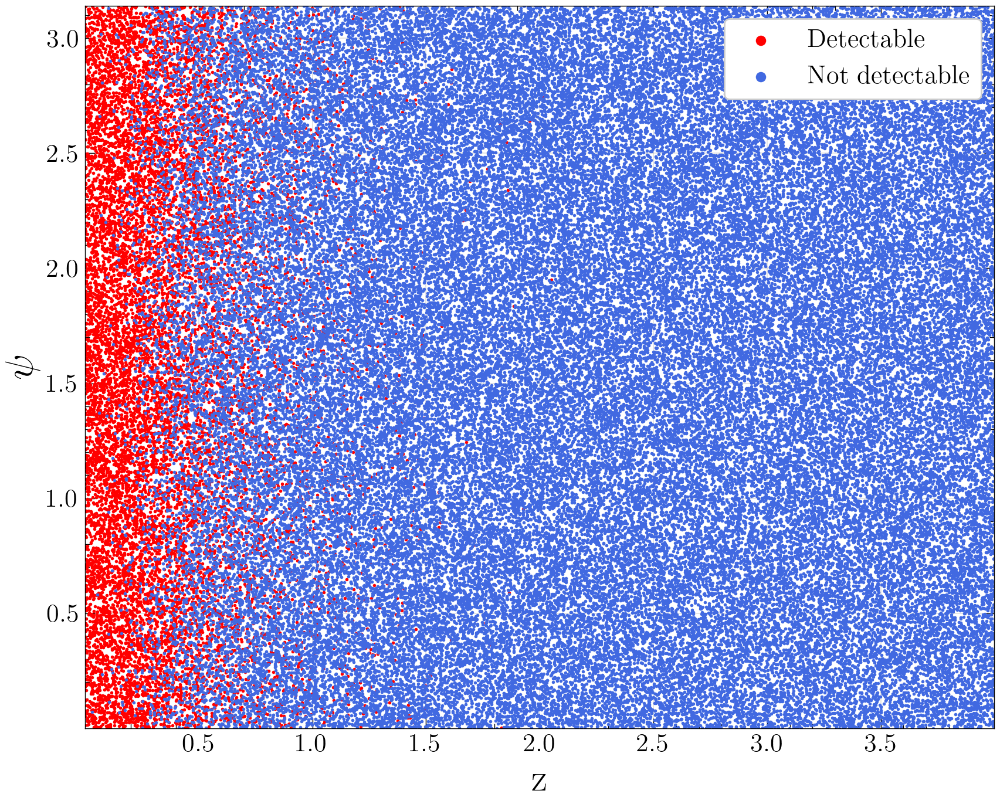

In [8]:
Plot(X[:,0], X[:,4], X_names[0], X_names[4])

- Clearly the most important variable is redshift.
- The detectability distribution in $\psi$ looks uniform.
- The detectability distribution in q is close to be uniform.
- $M_{tot}$ displays a detectability peak in the middle of its interval.
- $\iota$ displays a bimodality.

## 3) Classification

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=1)
mask = (y_train==1)

# It may be useful to scale the data
scaler = preprocessing.StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

### 3.1) SVM

In [10]:
def plot_svc_decision_function(clf):
    """Plot the decision function for a 2D SVC"""
    u = np.linspace(plt.xlim()[0], plt.xlim()[1], 30)
    v = np.linspace(plt.ylim()[0], plt.ylim()[1], 30)
    yy, xx = np.meshgrid(v, u)

    P = np.zeros_like(xx)
    for i, ui in enumerate(u):
        for j, vj in enumerate(v):
            Xgrid = np.array([ui, vj])
            P[i, j] = clf.decision_function(Xgrid.reshape(1,-1))[0]
    return plt.contour(xx, yy, P, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

Let's start with `z, iota`

Accuracy = 0.944
[[25054   624]
 [ 1062  3260]]


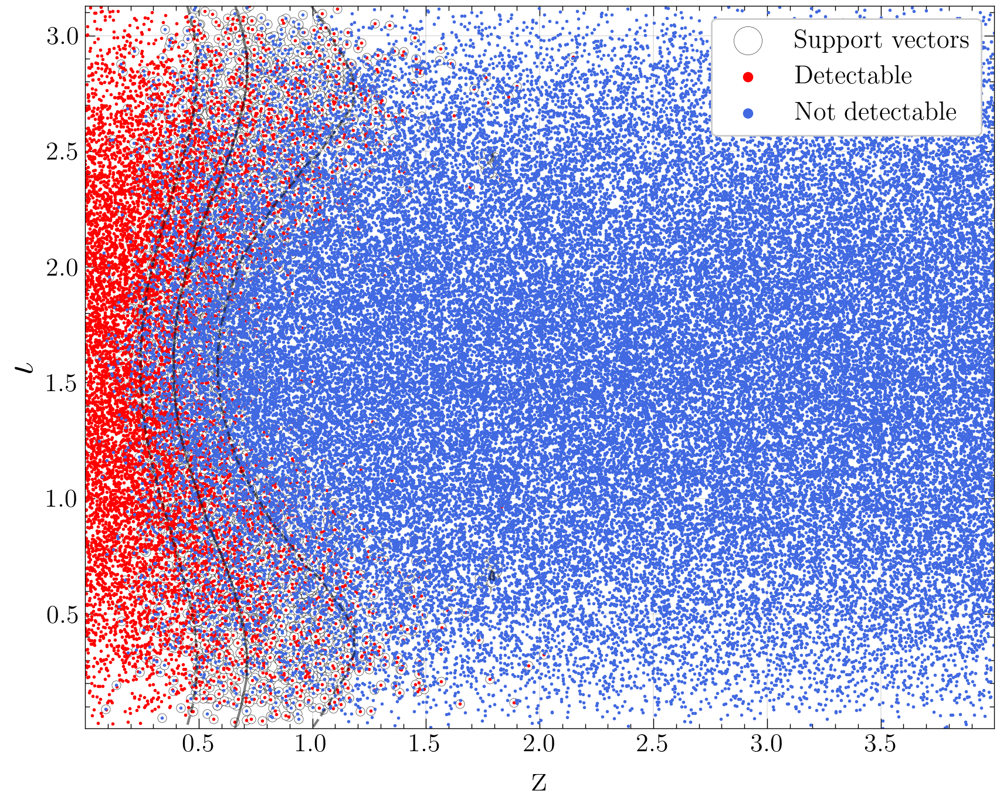

In [11]:
clf = SVC(kernel='rbf', C=10., gamma=0.2)
clf.fit(X_train[:,:2], y_train)
y_pred = clf.predict(X_test[:,:2])

conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
print(f'Accuracy = {accuracy:.3f}')
print(conf_matrix)

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=30, linewidths=0.2, edgecolor='k', facecolor='w', label='Support vectors')
Plot(X_train[:,0], X_train[:,1], X_names[0], X_names[1])
plot_svc_decision_function(clf);

Let's try with `z, M_tot`, with a proper scaling

Accuracy = 0.949
[[25188   490]
 [ 1029  3293]]


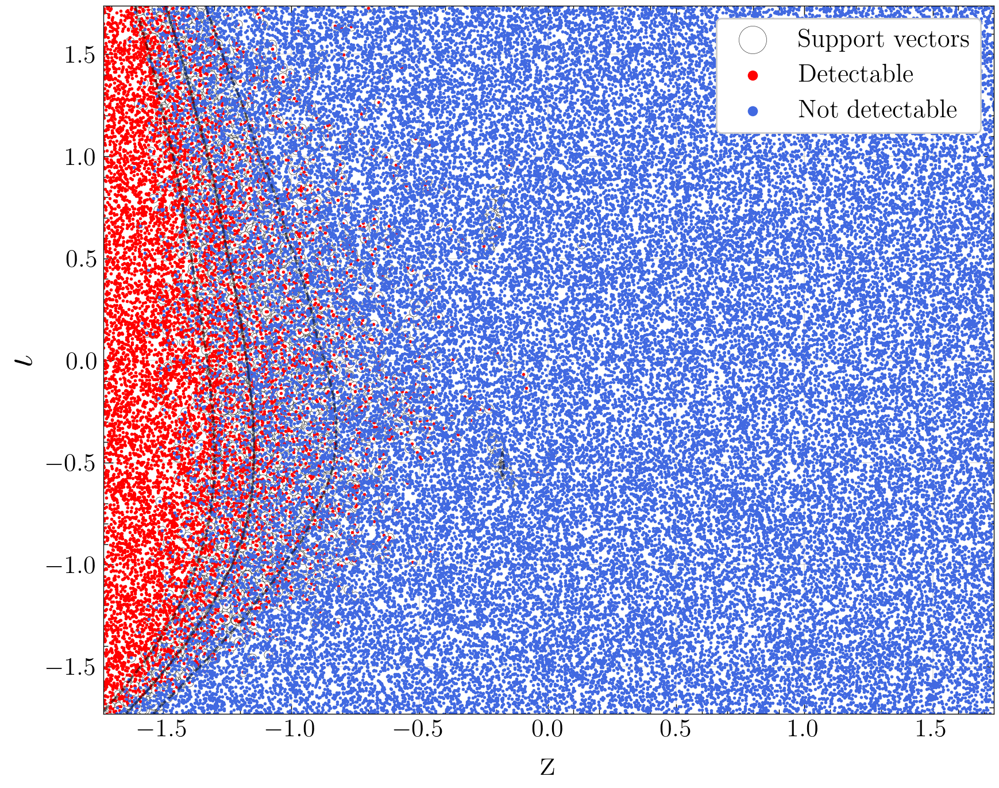

In [12]:
clf = SVC(kernel='rbf', C=10., gamma=0.2)
clf.fit(np.column_stack([X_train_scaled[:,0], X_train_scaled[:,2]]), y_train)
y_pred = clf.predict(np.column_stack([X_test_scaled[:,0], X_test_scaled[:,2]]))

conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
print(f'Accuracy = {accuracy:.3f}')
print(conf_matrix)

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=30, linewidths=0.2, edgecolor='k', facecolor='w', label='Support vectors')
Plot(X_train_scaled[:,0], X_train_scaled[:,2], X_names[0], X_names[1])
plot_svc_decision_function(clf);

Let's try to add more features

In [13]:
N_features = np.array([2, 3, 4, 5])

for i in range(len(N_features)):
    clf = SVC(kernel='rbf', C=10., gamma=0.3)
    clf.fit(X_train_scaled[:,:2+i], y_train)
    y_pred = clf.predict(X_test_scaled[:,:2+i])

    conf_matrix = confusion_matrix(y_test, y_pred)
    accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
    print(f'{N_features[i]} features:  accuracy = {accuracy:.3f}')

2 features:  accuracy = 0.944
3 features:  accuracy = 0.958
4 features:  accuracy = 0.964
5 features:  accuracy = 0.964


This is the best I've been able to obtain. \
Of course, one could cross-validate the model parameters, but `SVC` is a really time-consuming classification algorithm.

### 3.2) Random Forests

In [14]:
def PlotContour(clf, X_data):
    
    xlim = (np.min(X_data[:,0]), np.max(X_data[:,0]))
    ylim = (np.min(X_data[:,1]), np.max(X_data[:,1]))

    xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 100), np.linspace(ylim[0], ylim[1], 100))
    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1].reshape(xx.shape)
    plt.contour(xx, yy, Z, [0.5], colors='k')

Accuracy = 0.943
[[24952   726]
 [  984  3338]]


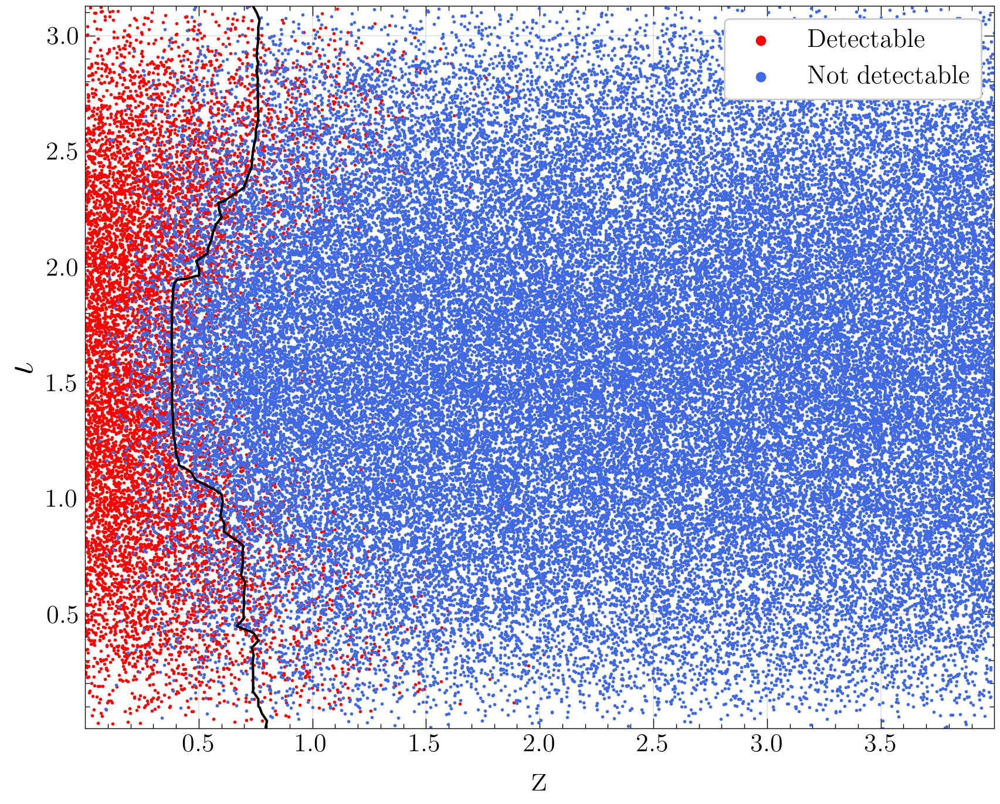

In [15]:
clf = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=6, random_state=0, n_jobs=int(mp.cpu_count()/2))
clf.fit(X_train[:,:2], y_train)
y_pred = clf.predict(X_test[:,:2])

conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
print(f'Accuracy = {accuracy:.3f}')
print(conf_matrix)

Plot(X_train[:,0], X_train[:,1], X_names[0], X_names[1]);
PlotContour(clf, X_train[:,:2])

Let's try to add more features

In [16]:
for i in range(len(N_features)):
    clf = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=10, random_state=0, n_jobs=int(mp.cpu_count()/2))
    clf.fit(X_train_scaled[:,:2+i], y_train)
    y_pred = clf.predict(X_test_scaled[:,:2+i])

    conf_matrix = confusion_matrix(y_test, y_pred)
    accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
    print(f'{N_features[i]} features:  accuracy = {accuracy:.3f}')

2 features:  accuracy = 0.943
3 features:  accuracy = 0.957
4 features:  accuracy = 0.962
5 features:  accuracy = 0.962


We could try to improve this result with cross-validation

In [18]:
from sklearn.model_selection import GridSearchCV

criterion_array = np.array(['entropy', 'gini', 'log_loss'])

grid = GridSearchCV(RandomForestClassifier(n_estimators=100, random_state=0, n_jobs=int(mp.cpu_count()/2)), 
                    {'criterion': criterion_array, 'max_depth': np.arange(5,20)}, 
                    n_jobs=int(mp.cpu_count()/2), cv=10, verbose=True)

grid.fit(X=X_train_scaled, y=y_train)
criterion_opt = grid.best_params_['criterion']
max_depth_opt = grid.best_params_['max_depth']
print(criterion_opt, max_depth_opt)

Fitting 10 folds for each of 45 candidates, totalling 450 fits
entropy 15


In [20]:
clf = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=15, random_state=0, n_jobs=int(mp.cpu_count()/2))
clf.fit(X_train_scaled, y_train)
y_pred = clf.predict(X_test_scaled)
conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
print(f'{5} features:  accuracy = {accuracy:.3f}')

5 features:  accuracy = 0.962


### 3.3) K-Nearest Neighbors

Accuracy = 0.941
[[24937   741]
 [ 1033  3289]]


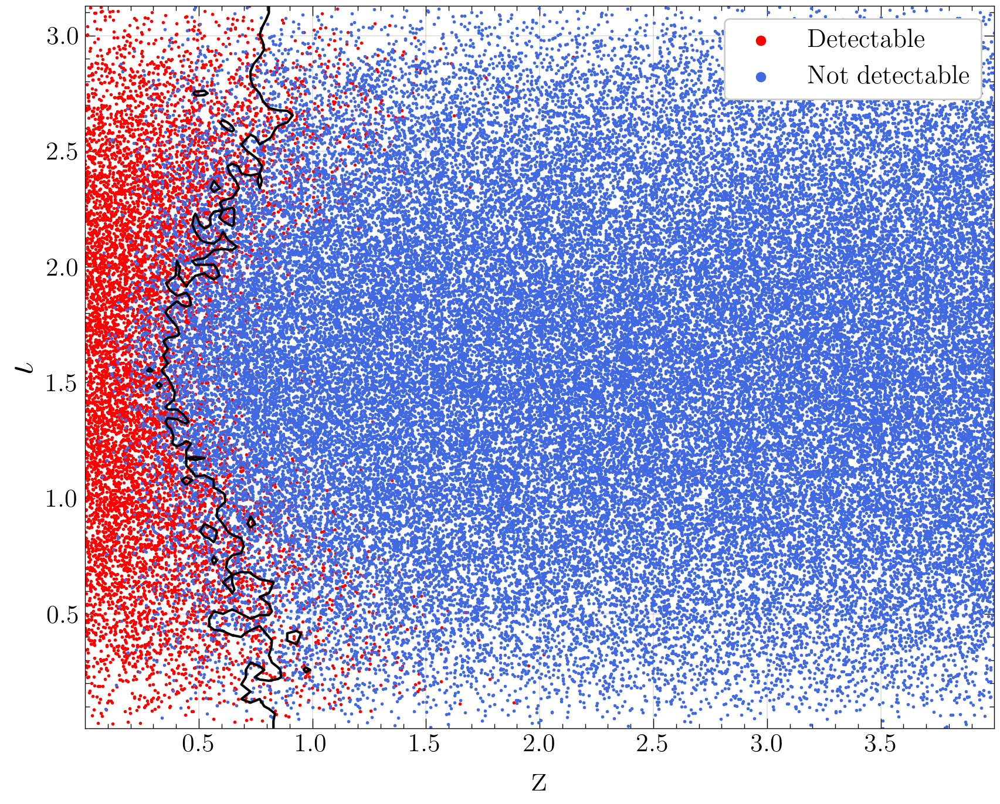

In [17]:
clf = KNeighborsClassifier(n_neighbors=18)
clf.fit(X_train[:,:2], y_train)
y_pred = clf.predict(X_test[:,:2])

conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
print(f'Accuracy = {accuracy:.3f}')
print(conf_matrix)

Plot(X_train[:,0], X_train[:,1], X_names[0], X_names[1]);
PlotContour(clf, X_train[:,:2])

Let's try to add more features

In [18]:
for i in range(len(N_features)):
    clf = KNeighborsClassifier(n_neighbors=18)
    clf.fit(X_train_scaled[:,:2+i], y_train)
    y_pred = clf.predict(X_test_scaled[:,:2+i])

    conf_matrix = confusion_matrix(y_test, y_pred)
    accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
    print(f'{N_features[i]} features:  accuracy = {accuracy:.3f}')

2 features:  accuracy = 0.941
3 features:  accuracy = 0.956
4 features:  accuracy = 0.961
5 features:  accuracy = 0.956


Again, we could try to improve this result with cross-validation

In [21]:
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(KNeighborsClassifier(), 
                    {'n_neighbors': np.arange(3,30)}, 
                    n_jobs=int(mp.cpu_count()/2), cv=10, verbose=True)

grid.fit(X=X_train_scaled, y=y_train)
n_neighbors_opt = grid.best_params_['n_neighbors']
print(n_neighbors_opt)

Fitting 10 folds for each of 27 candidates, totalling 270 fits
27


In [22]:
clf = KNeighborsClassifier(n_neighbors=27)
clf.fit(X_train_scaled, y_train)
y_pred = clf.predict(X_test_scaled)
conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = np.sum(conf_matrix.diagonal())/len(y_test)
print(f'{5} features:  accuracy = {accuracy:.3f}')

5 features:  accuracy = 0.958
